<a href="https://colab.research.google.com/github/DavidS324/Sexton_David_Math24/blob/main/Sexton_David_Final_Project_Notebook_Stats_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary
#Import necessary built-in functions and commands for later use

In [ ]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x,cmap='gray')
    ax.axis('off')
    fig.set_size_inches(20, 20)
    plt.show()
    #Defines the plot function for plotting images

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')
#Reads the URL to convert the images into a form for plotting

<ipython-input-3-e53fad719f3d>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


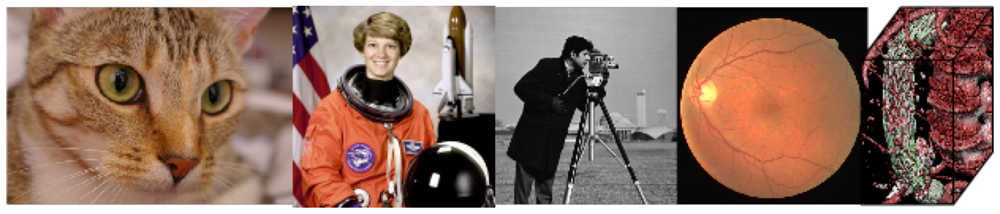

In [ ]:
plot(im)
#Plots the images

In [ ]:

net = alexnet(pretrained=True).cuda(0)
#Grabs the alexnet software pretrained on reading images

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 107MB/s]


In [ ]:
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([
   transforms.Resize(256),
   transforms.CenterCrop(224),
   transforms.ToTensor(),
   normalize
])
#Normalizes the size of the images before plotting, preprocess crops the center of the image and then resizes it to fit the whole square.

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')
#Selects an image to plot, in this case it selects the image of a dog.

<ipython-input-7-4ff3cde6a3b6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


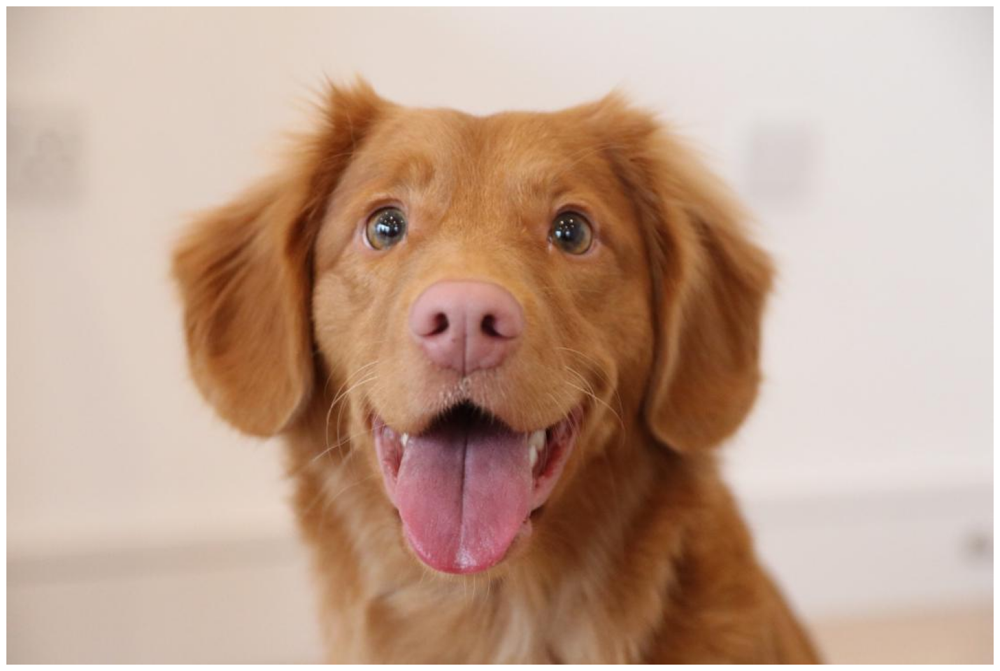

In [ ]:
plot(im)

In [ ]:
image = Image.fromarray(im) #convert to pil

In [ ]:
img_tensor = preprocess(image) #Crops and resizes image using preprocess function

In [ ]:
img_tensor = img_tensor.unsqueeze_(0) #Adds another dimension to img_tensor

In [ ]:
img_tensor.shape

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0) #Copies structure of img_tensor for img_variable

<ipython-input-13-aae1c5353a76>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #Copies structure of img_tensor for img_variable


In [ ]:
out = net(img_variable) #Runs the chosen picture through Alexnet

In [ ]:
label_index = out.cpu().data.numpy().argmax()
#Assigns a value for the guess from Alexnet

In [ ]:
label_index

207

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #Collects the top 10 guesses from Alexnet

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}
#Assigns values to the different labels from the URL

In [ ]:
print(labels[label_index])
#Displays the label from the list associated with the index guessed by Alexnet

golden retriever


In [ ]:
for i in range(10):
    print(labels[top_list[i]])
    #Prints the top 10 guesses from Alexnet

golden retriever
Brittany spaniel
Sussex spaniel
tennis ball
Irish setter, red setter
Blenheim spaniel
clumber, clumber spaniel
Labrador retriever
cocker spaniel, English cocker spaniel, cocker
vizsla, Hungarian pointer


In [ ]:
net
#Prints the output from Alexnet when not given an image

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224))
#Gives the shape and parameters of the different layers in Alexnet

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()
#Takes values from the image and converts them into an array

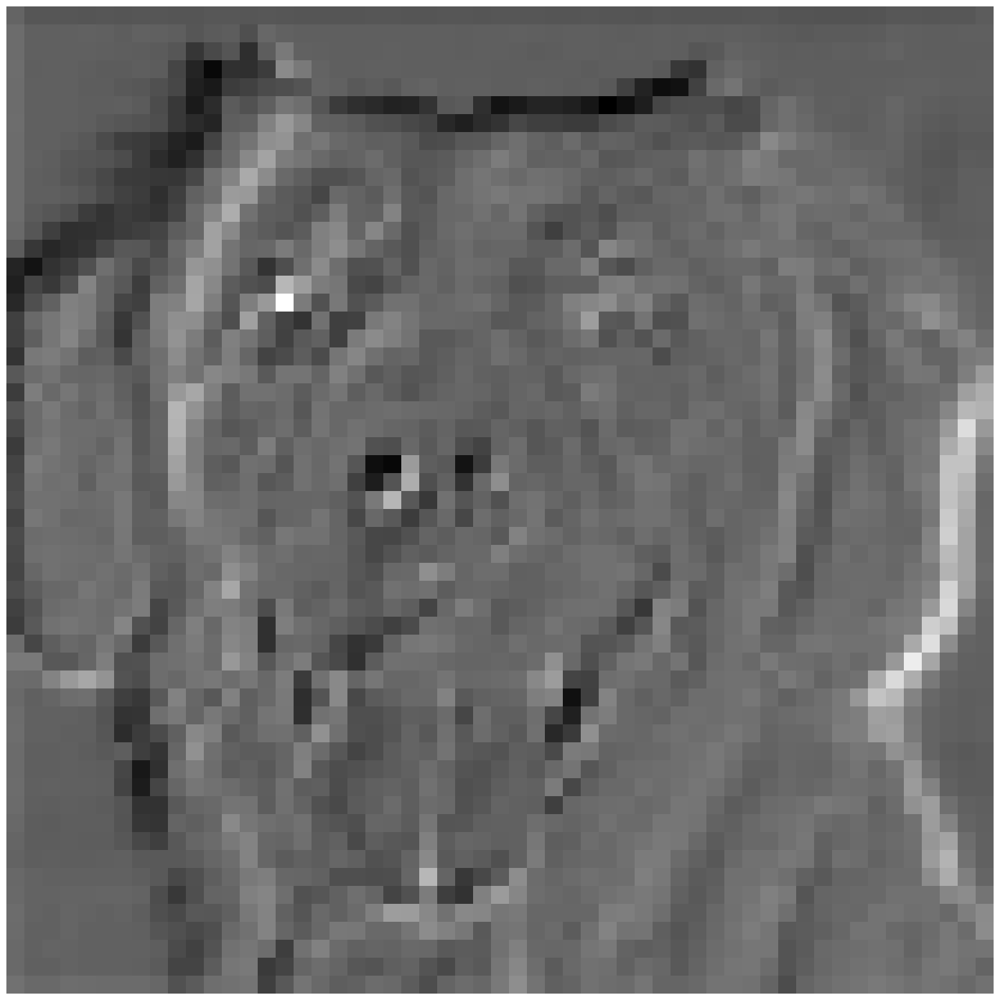

In [ ]:
plot(out[0,0,:,:])
#Plots the picture after being cropped and run through Alexnet

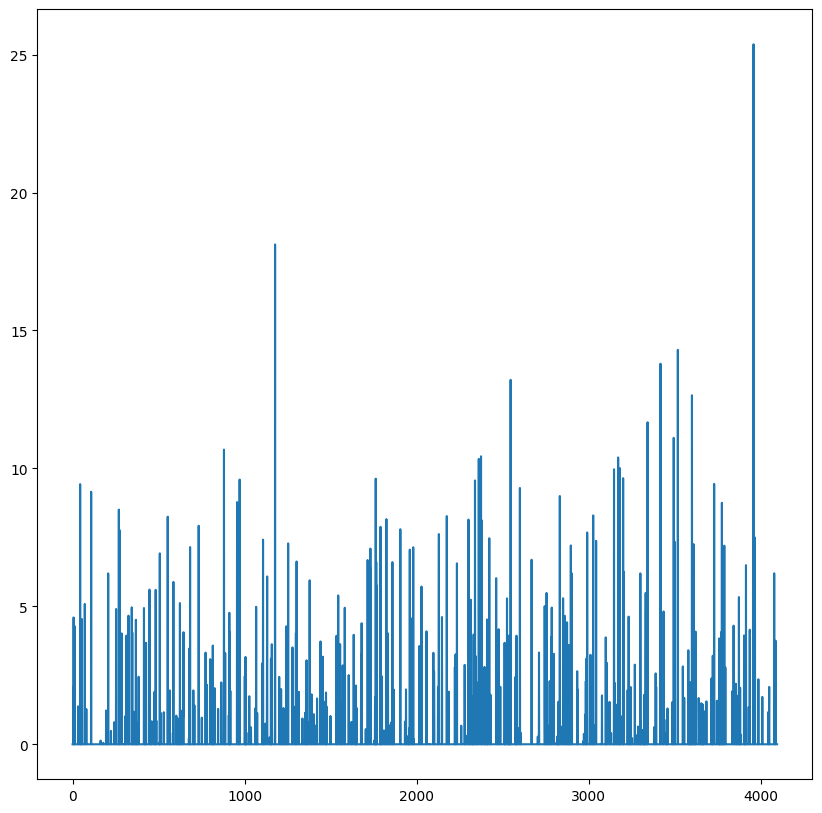

In [ ]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()
fig.set_size_inches(10, 10)
#Makes a plot of the different values of the image matrix

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


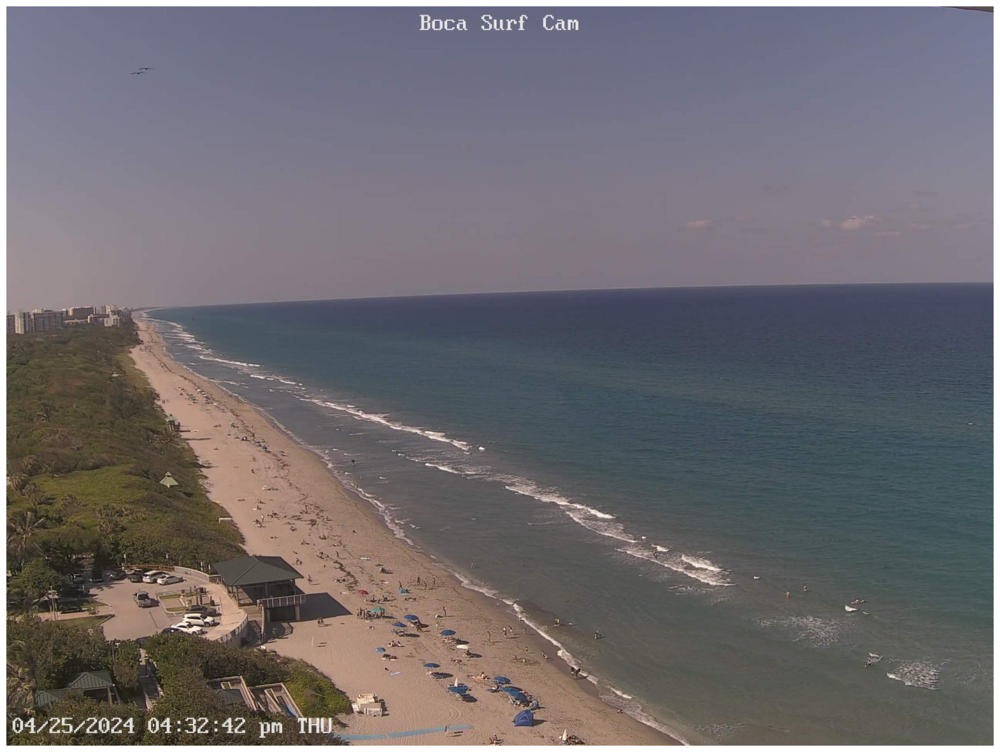

In [ ]:
plot(im)

In [ ]:
def load_im(im):
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

In [ ]:
out = net(load_im(im))

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im):
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])
        #Single function combining several previous lines, runs the image through Alexnet, gives it a value, makes a list of guesses, and prints the top guess and the list.

In [ ]:
inference(im)
#Runs the combined function for the surf cam image

breakwater, groin, groyne, mole, bulwark, seawall, jetty
____
breakwater, groin, groyne, mole, bulwark, seawall, jetty
seashore, coast, seacoast, sea-coast
wing
promontory, headland, head, foreland
volcano
valley, vale
sandbar, sand bar
beacon, lighthouse, beacon light, pharos
dam, dike, dyke
lakeside, lakeshore


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [ ]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb
#Import necessary functions and libraries
#The apply transforms line imports a command that will do most of the matrix operations needed for the images

In [ ]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))
    #Defines two seperate similar functions, the GPU function is capable of tracking gradients and is useful for backpropagation,
    # while the GPU_data function is not capable of tracking gradients but is better used for inference.

In [ ]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()
    #Function for plotting the images

In [ ]:
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#Functions to get slides from a URL and load the images
#Loading the images resizes them and crops the center

In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
#Grabs labels from a list for use in guesses after images go through Alexnet

In [ ]:
model = alexnet(weights='DEFAULT').to(device)
model.eval();
#Downloads Alexnet with the default weights to be applied to the images later

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:03<00:00, 79.8MB/s]


In [ ]:
url = "https://docs.google.com/presentation/d/18Ot6qrYGK30T_wCMB4UXfQJrKx0P6CCrvUDpjrbMQ9g/edit#slide=id.g2b78f0cde19_0_16"
#URL for the dataset

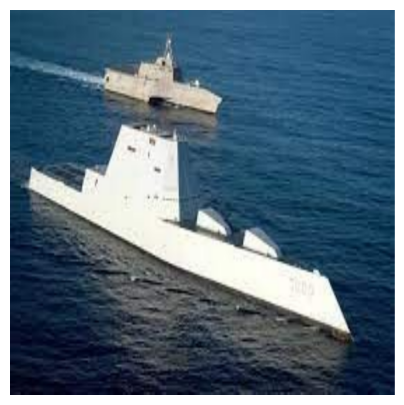

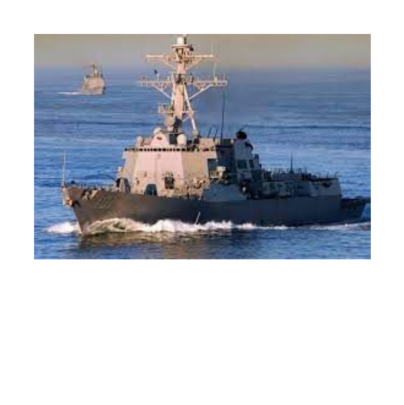

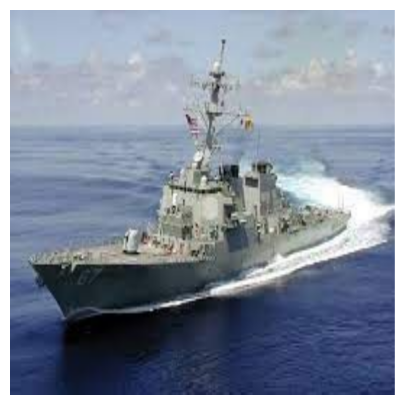

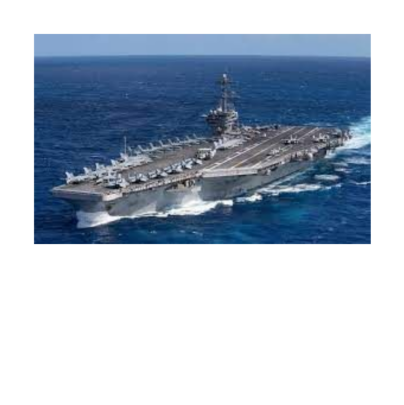

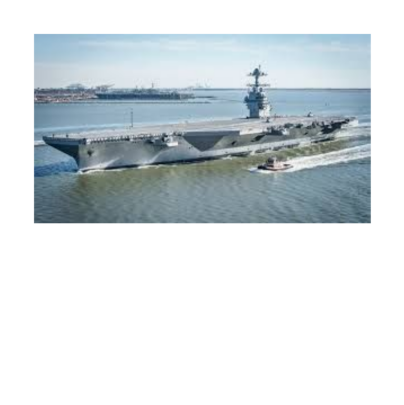

...

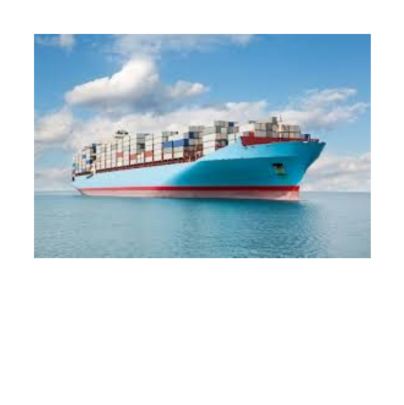

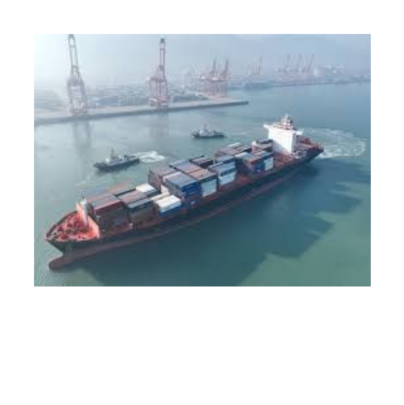

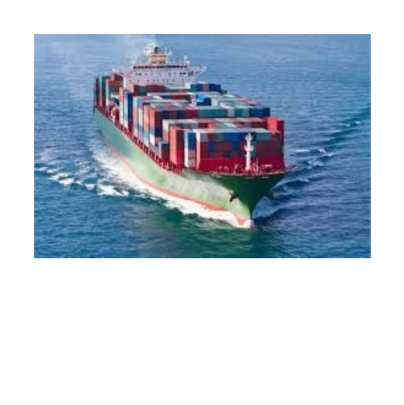

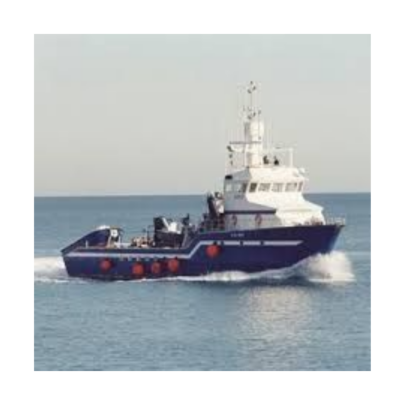

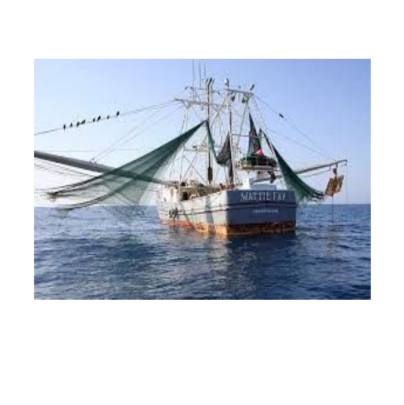

In [ ]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)
#Grabs and plots images from the dataset

In [ ]:
images.shape
#Shape of the dataset, 50 images with the same shape.

torch.Size([50, 3, 224, 224])

In [ ]:
model(images)
#Runs the images through the downloaded Alexnet model
#and prints the tensor for each of the images
#Also reshapes the images into arrays of 1000 values

tensor([[-0.6145, -5.1143,  4.0825,  ..., -4.7134,  1.2293, -0.2570],
        [ 0.6406, -4.0042,  0.3121,  ..., -3.7450, -1.6078, -4.2886],
        [-0.8389, -5.6727,  6.4131,  ..., -3.1369, -0.2842, -3.1405],
        ...,
        [-0.3387, -1.7614,  0.4636,  ..., -6.2734, -0.8060,  2.2293],
        [-1.0995, -2.1904, -0.1779,  ..., -6.4005, -3.0640, -0.0390],
        [-0.7695, -0.3067, -0.6341,  ..., -5.6374, -0.1535,  0.1159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images)

In [ ]:
y.shape
#Shape of the model matrix of the images, 50 arrays with 1000 values per array

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy()
#Gets the guesses from Alexnet

In [ ]:
for i in list(guesses):
    print(labels[i])
    #Prints the guesses from Alexnet for the dataset

aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft carrier, carrier, flattop, attack aircraft carrier
submarine, pigboat, sub, U-boat
aircraft carrier, carrier, flattop, attack aircraft carrier
aircraft

In [ ]:
Y = np.zeros(50,)
Y[25:] = 1
#Creates an array of 50 zeros and replaces the zeros with ones from #26 on.

In [ ]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy()
#Takes the color values and puts each number into a new array as a seperate value

In [ ]:
X.shape

(50, 1000)

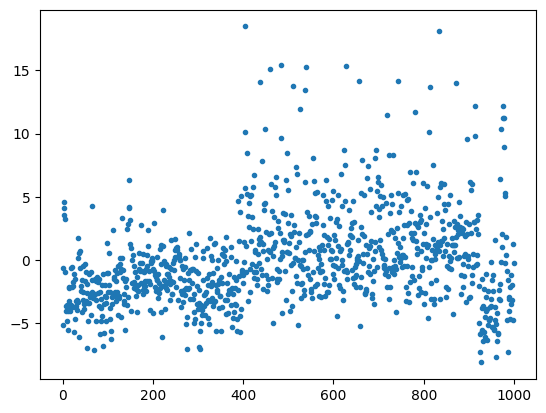

In [ ]:
plt.plot(X[0],'.')
#Plots the color values

In [ ]:
X[0]

array([-6.14527881e-01, -5.11427593e+00,  4.08245468e+00,  3.57254481e+00,
        4.61048460e+00,  3.22611427e+00, -9.45553541e-01, -4.00995255e+00,
       -3.63592291e+00, -3.53978777e+00, -4.78975964e+00, -5.51497078e+00,
       -4.04092407e+00, -2.14163947e+00, -2.20653105e+00, -3.28159428e+00,
       -3.74878097e+00, -4.05850029e+00, -6.28659129e-01, -3.52560472e+00,
       -2.10412955e+00, -5.21401703e-01, -2.02715731e+00, -1.71931148e+00,
       -3.73729944e+00, -5.67730141e+00, -1.07594121e+00, -1.49589777e+00,
       -4.66741562e+00, -3.66539741e+00, -3.25224328e+00, -3.95370078e+00,
       -3.19615889e+00,  1.85998991e-01,  1.70356607e+00, -3.30839586e+00,
        5.59457242e-01, -6.08674717e+00,  7.44133770e-01, -6.59821093e-01,
       -2.06083107e+00, -2.42682123e+00, -4.10729647e+00, -1.54337835e+00,
       -4.75809187e-01, -3.16948175e+00, -2.50817156e+00, -3.45458460e+00,
       -3.91236258e+00, -1.69726562e+00, -2.78130412e-01, -9.68282580e-01,
       -3.20894241e+00, -

In [ ]:
np.argmax(X[0])
#Find the index of the largest value in the X[0] array

403

In [ ]:
labels[948]
#Prints the label in slot 948

'Granny Smith'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10]
#Sets a variable to contain the top 10 guesses from Alexnet for printing later

In [ ]:
for i in top_ten:
    print(labels[i])
    #Prints the top 10 guesses from Alexnet for one of the images

aircraft carrier, carrier, flattop, attack aircraft carrier
submarine, pigboat, sub, U-boat
catamaran
liner, ocean liner
drilling platform, offshore rig
breakwater, groin, groyne, mole, bulwark, seawall, jetty
missile
projectile, missile
beacon, lighthouse, beacon light, pharos
trimaran


In [ ]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 36., 169., 348., 257., 108.,  44.,  18.,   7.,  11.,   2.]),
 array([-8.10651302, -5.44808149, -2.78964996, -0.13121843,  2.5272131 ,
         5.18564463,  7.84407616, 10.50250816, 13.16093922, 15.81937027,
        18.47780228]),
 <BarContainer object of 10 artists>)

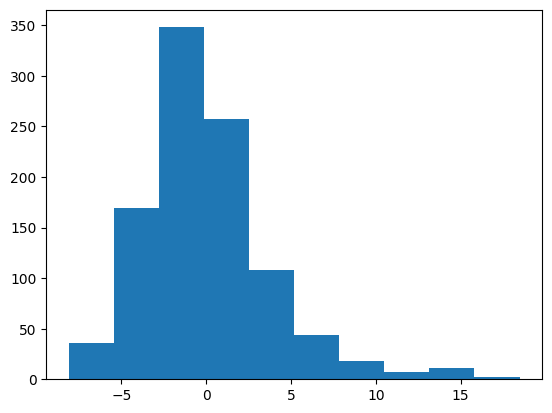

In [ ]:
plt.hist(X[0])
#Makes a histogram of the different value ranges  in X[0]

In [ ]:
X = GPU_data(X)
Y = GPU_data(Y)
#Creates arrays for inference

In [ ]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s
    #Subtracts the max from each row of data to keep the exponent of s1 manageable, it also divides each element in the array by the sum of the array.
    #The goal of this process is to convert the numbers into probabilities

In [ ]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]
    #Sums the array created by softmax and divides the sum by the size of the outputs array
    #This is done in an effort to measure the average cross_entropy loss that results from applying softmax to the dataset

The math used in the Truncated_Normal function is based on the Box-Muller Transform and is meant to generate an array of uniformly distributed random numbers.

In [ ]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z
    #Creates two arrays of the same size, the first array is multiplied by 1-exp(-2) and the adds the exp(-2) to the array while the second array is unchanged.
    #Finally it multiplies the square root of 2*log of the first array by the cosine of 2*pi* the second array

In [ ]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]
        #Keeps a running value, increasing with each correct guess, it then divides the total number of correct guesses by the number of total guesses to get the accuracy percentage

In [ ]:
X.shape

torch.Size([50, 1000])

In [ ]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y
    #Function for deciding the behavior depending on which mode is selected
    #The functions are very similar, the only difference is the name of the arrays that the random numbers and addition are applied to

In [ ]:
def model(x,w):

    return x@w[0]
    #gives the value of a matrix multiplication of x and w

In [ ]:
def make_plots():

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})
    #Makes plots of the accuracy of the model guesses

In [ ]:
wb.init(project="Linear_Model_Photo_1");
wb.init()
c = wb.config

c.h = 0.001
c.b = 4
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()
#Connects to weights and biases to measure loss and plot the measurements

<IPython.core.display.Javascript object>

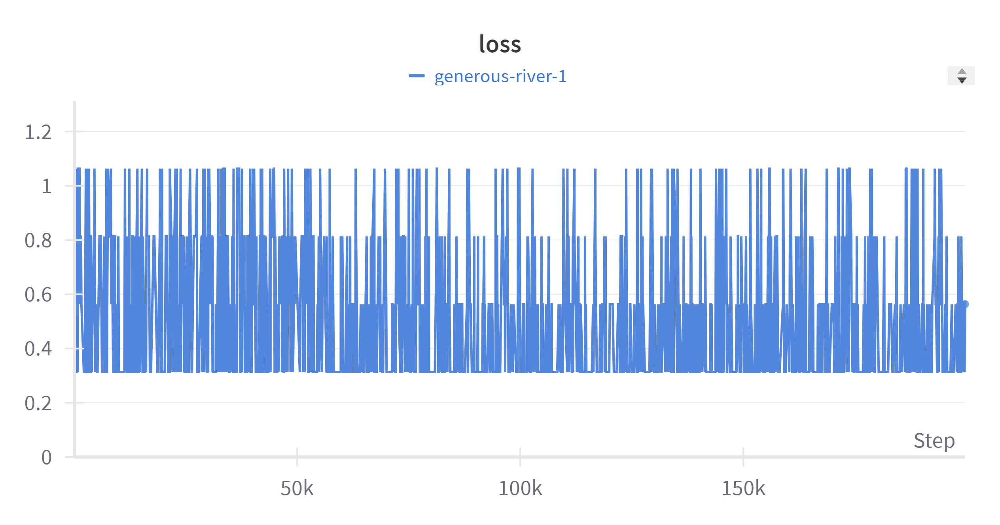

In [ ]:
#This graph displays the loss values of the images

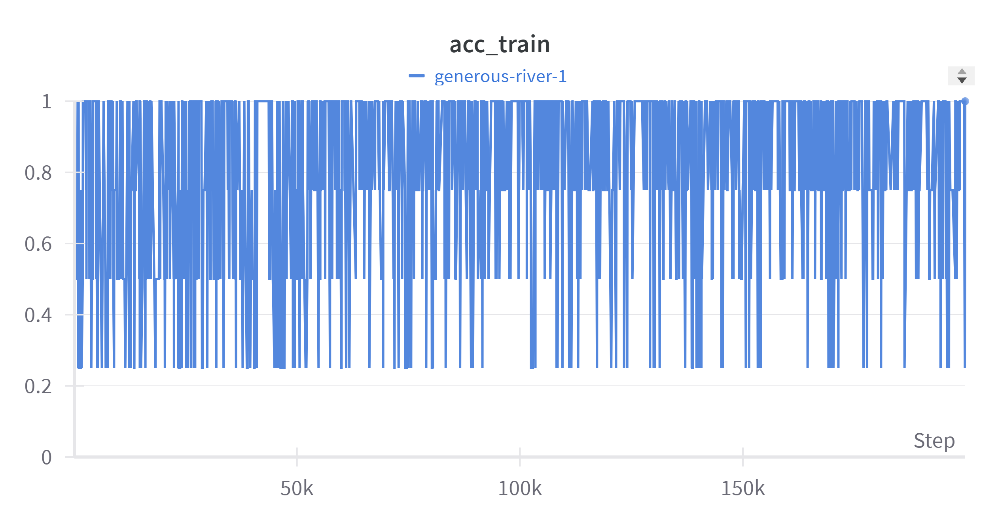

In [ ]:
#This graph displaus the accuracy of the guesses by Alexnet